# Fortress Protocol Exploit 

This notebook visualizes and analyzes the Fortress Protocl attack that occured May 9th, 2022

1. Hacker Address: 0xA6AF2872176320015f8ddB2ba013B38Cb35d22Ad
1. Transaction Hash: 0x13d19809b19ac512da6d110764caee75e2157ea62cb70937c8d9471afcb061bf

The exploit was an oracle manipulation attack deployed by an anon hacker.

In [1]:
import pandas as pd
import seaborn as sns
import scipy

import re, seaborn as sns, numpy as np, pandas as pd, random
from pylab import *
from matplotlib.pyplot import plot, show, draw, figure, cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
sns.set_style("whitegrid", {'axes.grid' : False})

## Tracking the Exploiter

We need to check whether one variant resulted in a higher conversion rate than another. Let's start with a time series.

In [217]:
# Fetched by Covalent API via Analyst Mode
tx_data = pd.read_csv("Exploiter-TX.csv")


/shared-libs/python3.7/py-core/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3229: DtypeWarning: Columns (8,39,42,43) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [176]:
exploiter_balance = pd.read_csv("Exploiter-balance.csv")

In [168]:
tx_data.head()

,block_signed_at,block_height,tx_hash,tx_offset,successful,from_address,from_address_label,to_address,to_address_label,value,...,log_events_decoded_params_type,log_events_decoded_params_indexed,log_events_decoded_params_decoded,log_events_decoded_params_value,log_events_raw_log_topics_3,log_events_decoded,log_events_decoded_params,log_events_decoded_params_value_value,log_events_decoded_params_value_typeAsString,log_events_decoded_params_value_bitSize
0,2022-05-09T06:48:07Z,17646928,0x67adc3f4c3928c71c245611dce6185ac87163910015b...,135,True,0x46906853575a340cb52893b114aff93f22be6bda,NaN,0x1af60876c6bf49c3cfa9b594d413940bc6ade02b,NaN,0,...,address,True,True,0x46906853575a340cb52893b114aff93f22be6bda,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-05-09T06:48:07Z,17646928,0x67adc3f4c3928c71c245611dce6185ac87163910015b...,135,True,0x46906853575a340cb52893b114aff93f22be6bda,NaN,0x1af60876c6bf49c3cfa9b594d413940bc6ade02b,NaN,0,...,address,True,True,0xa6af2872176320015f8ddb2ba013b38cb35d22ad,NaN,NaN,NaN,NaN,NaN,NaN
2,2022-05-09T06:48:07Z,17646928,0x67adc3f4c3928c71c245611dce6185ac87163910015b...,135,True,0x46906853575a340cb52893b114aff93f22be6bda,NaN,0x1af60876c6bf49c3cfa9b594d413940bc6ade02b,NaN,0,...,uint256,False,True,1000000000000000000,NaN,NaN,NaN,NaN,NaN,NaN
3,2022-05-09T06:48:07Z,17646928,0x67adc3f4c3928c71c245611dce6185ac87163910015b...,135,True,0x46906853575a340cb52893b114aff93f22be6bda,NaN,0x1af60876c6bf49c3cfa9b594d413940bc6ade02b,NaN,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2022-05-08T21:04:15Z,17635254,0x37bdaf81314298cb4cf6d426ea9e982bad70ab4af866...,68,True,0xa6af2872176320015f8ddb2ba013b38cb35d22ad,NaN,0x66495022566d05cef5f796d9dccc828ba67c162e,NaN,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
_deepnote_run_altair(tx_data, """{"$schema":"https://vega.github.io/schema/vega-lite/v4.json","mark":{"type":"bar","tooltip":{"content":"data"}},"height":220,"autosize":{"type":"fit"},"data":{"name":"placeholder"},"encoding":{"x":{"field":"block_height","type":"quantitative","sort":null,"scale":{"type":"linear","zero":false}},"y":{"field":"to_address","type":"nominal","sort":null,"scale":{"type":"linear","zero":true}},"color":{"field":"block_height","type":"quantitative","sort":null,"scale":{"type":"linear","zero":false}}}}""")

alt.Chart(...)

In [24]:
tx_data.shape
# Rows: 64011 Columns: 45

(64011, 45)

In [177]:
exploiter_balance.head()

,contract_decimals,contract_name,contract_ticker_symbol,contract_address,logo_url,last_transferred_at,type,balance,balance_24h,quote_rate,quote_rate_24h,quote,quote_24h,nft_data,supports_erc_0,supports_erc
0,18,Bittt.io,Bittt.io,0x9603a3d3dcccf5ef1a2060a3da796ac084cc66eb,https://logos.covalenthq.com/tokens/56/0x9603a...,2022-05-06T14:15:55Z,cryptocurrency,268551000000000000000000,NaN,0.103627,0.100589,27829.18600,NaN,NaN,erc20,NaN
1,9,axax.io,axax.io,0x58b5c4697dc70f3d889225260944cdd9c270c132,https://logos.covalenthq.com/tokens/56/0x58b5c...,2022-04-27T06:14:01Z,cryptocurrency,77000000000000,NaN,0.072357,0.070236,5571.52340,NaN,NaN,erc20,NaN
2,6,Crypto Gold Box,CGB,0x7e6202903275772044198d07b8a536cc064f8480,https://logos.covalenthq.com/tokens/56/0x7e620...,2022-04-19T18:49:44Z,cryptocurrency,211000000,NaN,2.326902,2.258677,490.97626,NaN,NaN,erc20,NaN
3,18,0Apply Rich Token,ART,0x949e0a0672299e6fcd6bec3bd1735d6647b20618,https://logos.covalenthq.com/tokens/56/0x949e0...,2022-04-19T23:55:02Z,cryptocurrency,576000000000000000,NaN,671.855100,652.156400,386.98853,NaN,NaN,erc20,NaN
4,18,Binance Coin,BNB,0xeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeeee,https://www.covalenthq.com/static/images/icons...,NaN,cryptocurrency,951171324500866435,NaN,283.373660,264.962400,269.53690,NaN,NaN,NaN,NaN


In [216]:
_deepnote_run_altair(exploiter_balance, """{"$schema":"https://vega.github.io/schema/vega-lite/v4.json","mark":{"type":"point","tooltip":{"content":"data"}},"height":220,"autosize":{"type":"fit"},"data":{"name":"placeholder"},"encoding":{"x":{"field":"balance","type":"nominal","sort":{"order":"descending","encoding":"x"},"scale":{"type":"linear","zero":false}},"y":{"field":"contract_name","type":"nominal","sort":null,"scale":{"type":"linear","zero":false}},"color":{"field":"balance","type":"quantitative","sort":null,"scale":{"type":"linear","zero":false}}}}""")

alt.Chart(...)

In [163]:
new = exploiter_balance["contract_name"] = "Fortress"

In [166]:
display(exploiter_balance.iloc[1])

contract_decimals                                                         9
contract_name                                                      Fortress
contract_ticker_symbol                                              axax.io
contract_address                 0x58b5c4697dc70f3d889225260944cdd9c270c132
logo_url                  https://logos.covalenthq.com/tokens/56/0x58b5c...
last_transferred_at                                    2022-04-27T06:14:01Z
type                                                         cryptocurrency
balance                                                      77000000000000
balance_24h                                                             NaN
quote_rate                                                         0.072357
quote_rate_24h                                                     0.070236
quote                                                             5571.5234
quote_24h                                                               NaN
nft_data    

/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  This is separate from the ipykernel package so we can avoid doing imports until


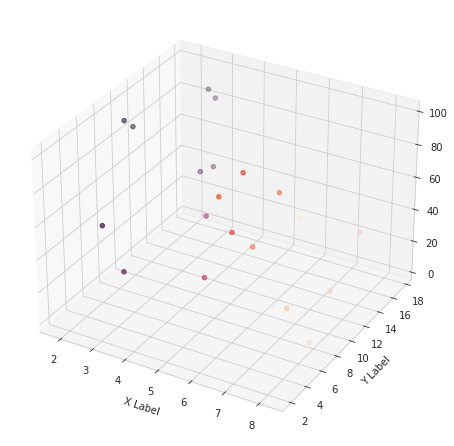

In [167]:
fig = plt.figure(figsize=(6,6))

ax = Axes3D(fig) # Method 1
# ax = fig.add_subplot(111, projection='3d') # Method 2

x = np.random.uniform(1, 9,size=20)
y = np.random.uniform(1,18,size=20)
#z = np.random.uniform(1,100,size=20)


ax.scatter(x, y, z, c=x, marker='o')
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
#ax.set_zlabel('Z Label')

plt.show()

In [69]:
exploiter_balance.shape

(22, 16)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=da32fd9b-3294-4667-b642-9aad05b2a7b4' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>